In [1]:
# modules
from imports import np, plt, iio, cv2, gaussian, Path, gf, filters, data, fusion, recalage

# functions
from imports import gray_to_rgb, plot_images

# variables
from imports import BASE_DIR, multi_exposure_dataset, multi_focus_dataset, ours_dataset, multi_exposure_sample, multi_exposure_sample, multi_focus_sample, ours_sample, gray_sample

# additional computations
focus_gff = fusion.gff(multi_focus_sample)
multi_focus_fused = focus_gff.fusion()

# Testing on our own data

A simple way to figure out the limits of an algorithm is to test it ourselves.

## Robustness to misalignment

In practice, it is difficult to obtain photographs of the exact same scene with different focus. The photographer might move, and the subjects might move. Although adequate image registration could mitigate this issue, we were interested to see how misalignment impacts the fusion algorithm.

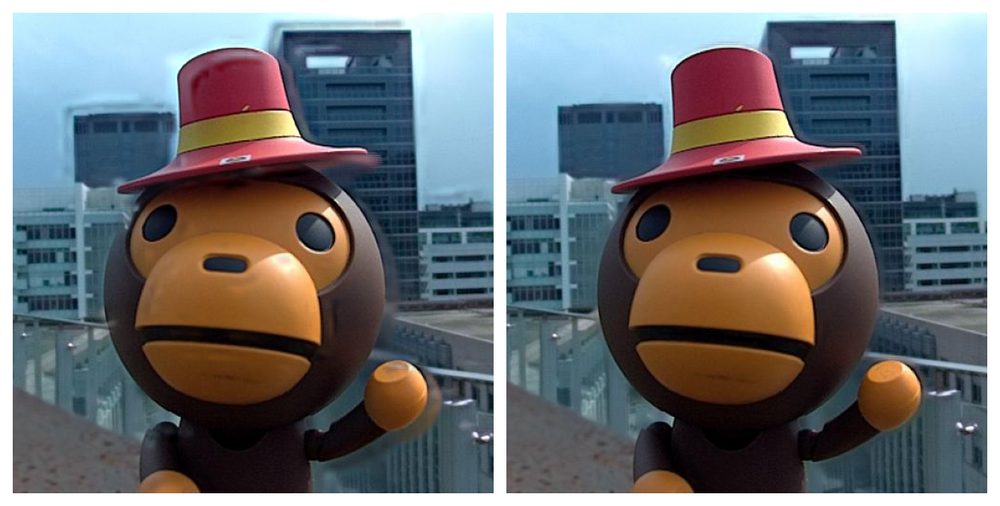

In [2]:
misalignment = 10
misalign_sample = [
    multi_focus_sample[0][misalignment:, misalignment:, :],
    multi_focus_sample[1][:-misalignment, :-misalignment, :]
]

misalign_gff = fusion.gff(misalign_sample)
misalign_fused = misalign_gff.fusion()

plot_images(misalign_fused, multi_focus_fused[misalignment:, misalignment:, :])
plt.show()

We can see there is an (expected) ghosting effect. This doesn't bid well for our own data, let's see what we get.

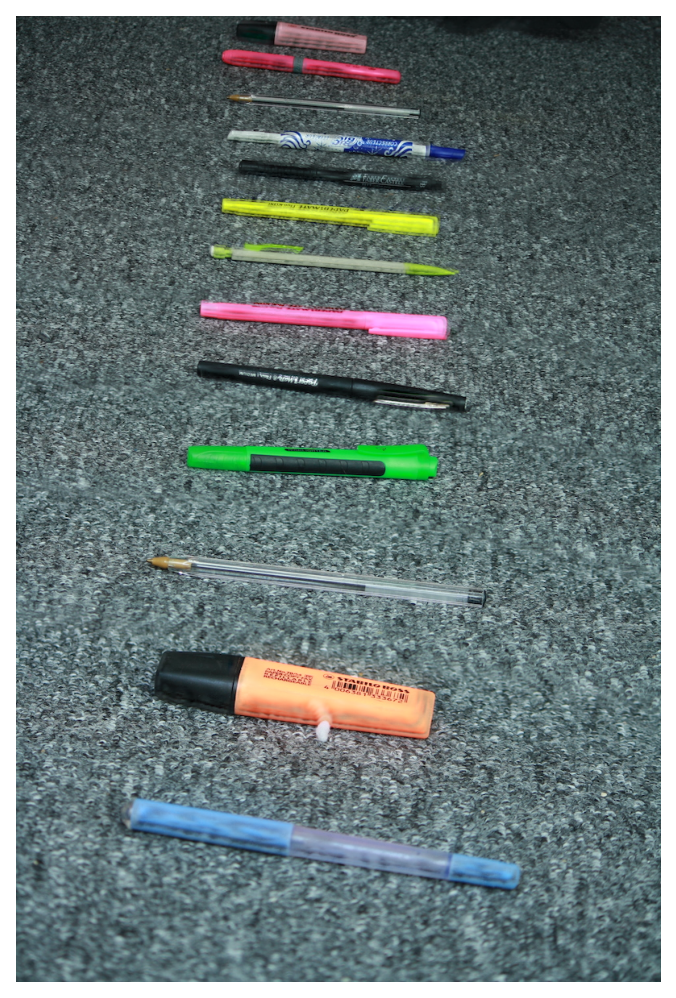

In [3]:
ours_gff = fusion.gff(ours_sample)
ours_fused = ours_gff.fusion()

fig, ax = plt.subplots(figsize=(15, 8))
plt.sca(ax)
plt.axis('off')
plt.imshow(ours_fused)
plt.show()

That's really not good. We took the pictures with a camera mounted on a tripod, so its movements should have been minimal. Yet we observe a duplication effect in zones that are in focus in several images, suggesting misalignment.

The reason is that by changing the zone of focus between photographs, we change the internal parameters of the camera (namely, its focal distance) -- which changes its calibration matrix.

## Preliminary registration

Since all photographs are taken from the same spot (no translation), we know that pairs of images are linked by a homography. Our idea then was to use registration techniques to retrieve these homographies, express all images in a single coordinate frame, and only then apply the fusion algorithm. The algorithm thus writes

1. Choose $I_0$ one of the images. We will express everything in its reference frame
2. Registration step  
    a. extract keypoints from images  
    b. $\forall k$ compute homographies $H_{k}$ from $I_{k}$ to $I_0$ (RANSAC algorithm)  
3. Apply the guided filter fusion algorithm on the $H_kI_k$ images

However, the homography transformation is only valid in the pinhole camera model which of course if not valid here (the whole point is to deal with out of focus objects!). We must try to only transform pairs of images that share a region in-focus. This adds a preliminary ordering step to the algorithm above:

0. Order images by focal distance
1. We will express everything in the reference frame of the first image
2. Registration step  
    a. extract keypoints from images  
    b. $\forall k$ compute homographies $H_{k}$ from $I_{k+1}$ to $I_{k}$ (RANSAC algorithm)  
3. Apply the guided filter fusion algorithm on the $H_1H_2\ldots H_kI_k$ images

In our case, we do not know the focal distance of each pictures. Instead we leverage the fact that we photographed an almost horizontal plane, and use as a heuristic the mean ordinate $y$ of the region in focus, which we can get from the refined weight maps.

In [4]:
# compute weight maps
ours_gff = fusion.gff(ours_sample)
_ = ours_gff.fusion()

# sort by focus
def normalize(arr):
    return arr / np.sum(arr)
weights = ours_gff.refined_weights["base"]
order = np.argsort( [np.mean(normalize(weight) * np.arange(weight.shape[0])[:, None]) for weight in weights])
ours_sample = [ours_sample[i] for i in order]

# registration
registered_sample = recalage.registration(*ours_sample)

registered_gff = fusion.gff(registered_sample)
registered_fused = registered_gff.fusion()

Registered images


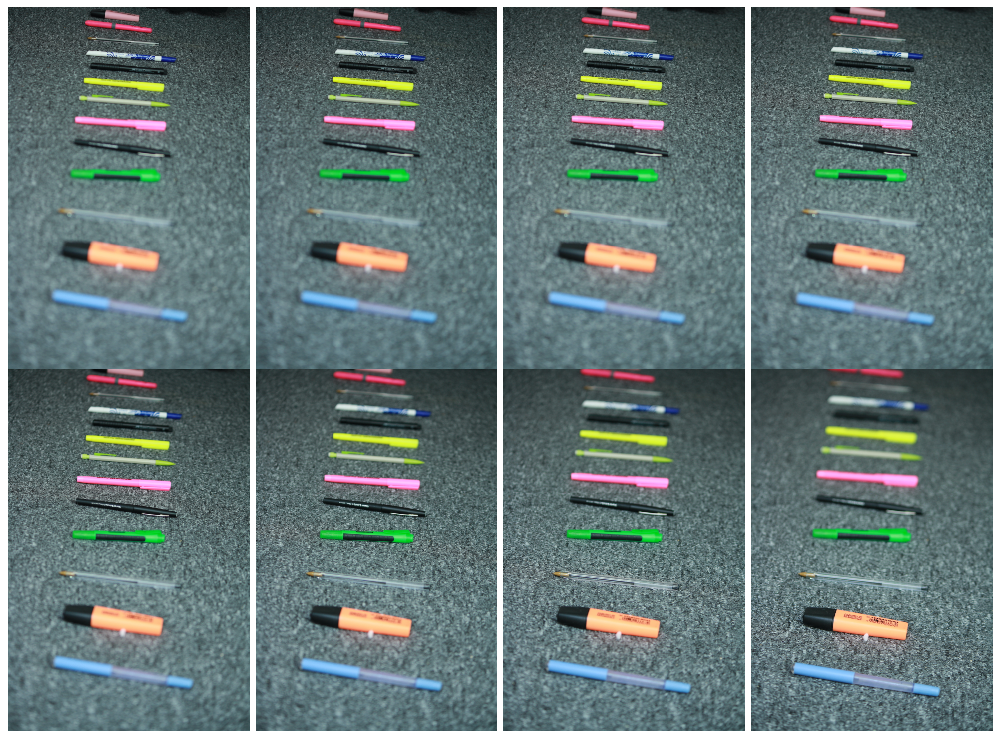


Check that the weight maps are sorted


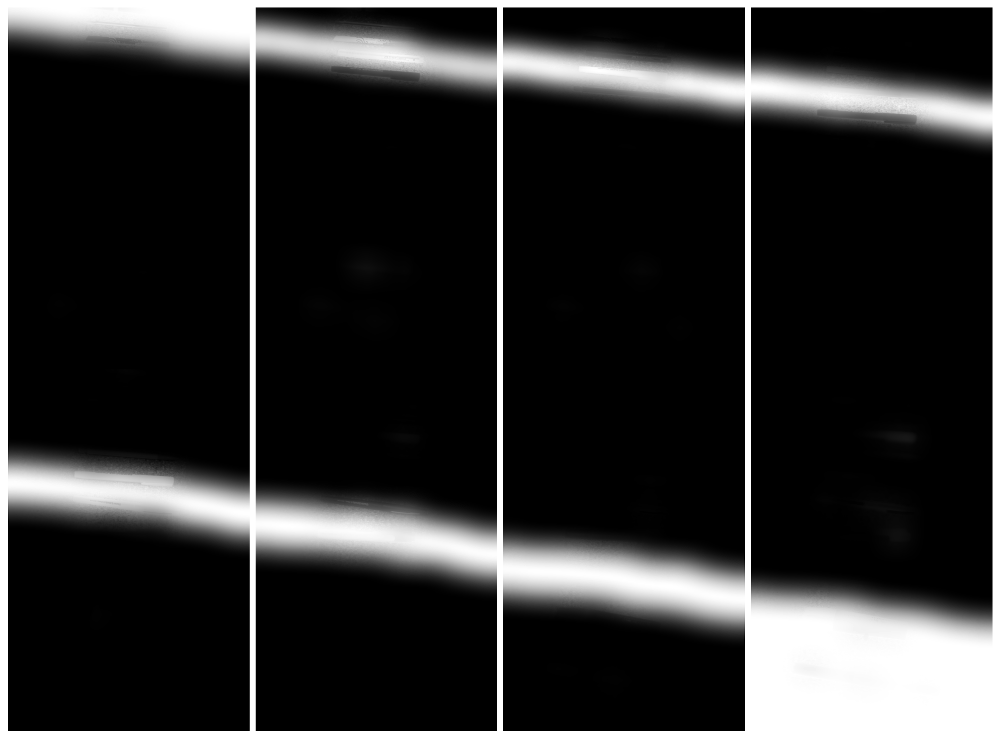

In [5]:
print("Registered images")
plot_images(*ours_sample, maxwidth=4)
plt.show()
print()

print("Check that the weight maps are sorted")
plot_images(*registered_gff.refined_weights["base"], maxwidth=4)
plt.show()
print()

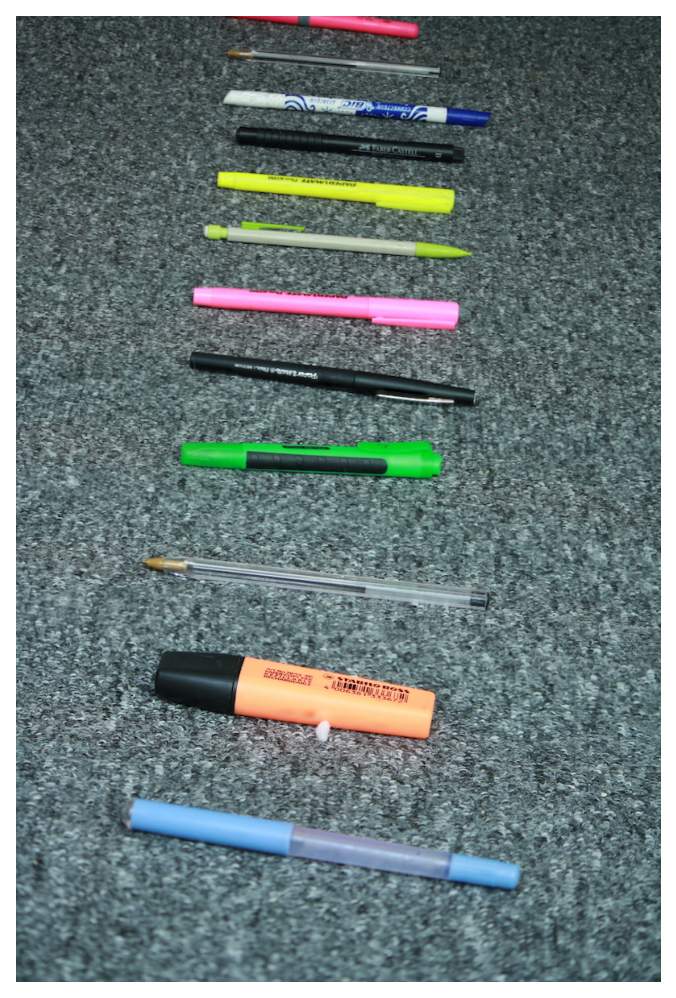

In [6]:
fig, ax = plt.subplots(figsize=(15, 8))
plt.sca(ax)
plt.axis('off')
plt.imshow(registered_fused)
plt.show()

Much better !